In [1]:
import pandas as pd
# importa a biblioteca pandas para o meu programa
# Como o pandas podemos importar tabelas ou um banco de dados e criar um dataframe

# Aqui fica o endereço da fonte de dados
font = "https://github.com/alura-cursos/imersao-dados-2-2020/blob/master/MICRODADOS_ENEM_2019_SAMPLE_43278.csv?raw=true"

# com esse comando, logo abaixo, criamos nosso dataframe 
dados = pd.read_csv(font)

# Esse comando podemos mostrar as cincos primeira linhas do nosso dataframe; mas esse valor pode ser mudado
dados.head()

,NU_INSCRICAO,NU_ANO,CO_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA,CO_UF_RESIDENCIA,SG_UF_RESIDENCIA,NU_IDADE,TP_SEXO,TP_ESTADO_CIVIL,TP_COR_RACA,...,Q016,Q017,Q018,Q019,Q020,Q021,Q022,Q023,Q024,Q025
0,190001004661,2019,1506138,Redenção,15,PA,17,M,1,3,...,A,A,A,A,B,A,C,A,B,B
1,190001004674,2019,1504208,Marabá,15,PA,23,M,1,3,...,A,A,A,B,A,A,B,A,A,B
2,190001004722,2019,1501402,Belém,15,PA,35,F,2,1,...,A,A,A,B,A,B,B,A,A,B
3,190001004735,2019,1507300,São Félix do Xingu,15,PA,23,F,1,3,...,A,A,A,B,A,A,B,A,A,B
4,190001004776,2019,1500800,Ananindeua,15,PA,16,F,1,3,...,A,A,A,B,A,A,D,A,A,B


In [2]:
# O pandas suporta a integração com muitos formatos de arquivo ou fontes de dados fora da caixa 
# (csv, excel, sql, json, parquet, ...). Importando dados de cada um deles as fontes de dados são fornecidas por 
# função com o prefixo read_*. Da mesma forma, os to_*métodos são usados ​​para armazenar dados.

In [3]:
dados.shape
# Aqui mostra a quantidade de linhas e coluna que tem o nosso dataframe

(127380, 136)

In [4]:
# O dados.shape retornou uma tupla. Se quisermos retornar um elemento da tupla, basta só, entre parentese, colocar 
# o número do elemento.
dados.shape[0] # vai retorna 127380 o número de linhas desse dataframe

127380

In [5]:
# se eu quiser uma coluna especifica basta eu colocar entre parentese o nome da coluna, da mesma forma que está
# escrito no dataframe.
dados["SG_UF_RESIDENCIA"]

0         PA
1         PA
2         PA
3         PA
4         PA
          ..
127375    MG
127376    BA
127377    BA
127378    BA
127379    MG
Name: SG_UF_RESIDENCIA, Length: 127380, dtype: object

In [6]:
# retornar os das colunas
dados.columns.values

array(['NU_INSCRICAO', 'NU_ANO', 'CO_MUNICIPIO_RESIDENCIA',
       'NO_MUNICIPIO_RESIDENCIA', 'CO_UF_RESIDENCIA', 'SG_UF_RESIDENCIA',
       'NU_IDADE', 'TP_SEXO', 'TP_ESTADO_CIVIL', 'TP_COR_RACA',
       'TP_NACIONALIDADE', 'CO_MUNICIPIO_NASCIMENTO',
       'NO_MUNICIPIO_NASCIMENTO', 'CO_UF_NASCIMENTO', 'SG_UF_NASCIMENTO',
       'TP_ST_CONCLUSAO', 'TP_ANO_CONCLUIU', 'TP_ESCOLA', 'TP_ENSINO',
       'IN_TREINEIRO', 'CO_ESCOLA', 'CO_MUNICIPIO_ESC',
       'NO_MUNICIPIO_ESC', 'CO_UF_ESC', 'SG_UF_ESC',
       'TP_DEPENDENCIA_ADM_ESC', 'TP_LOCALIZACAO_ESC', 'TP_SIT_FUNC_ESC',
       'IN_BAIXA_VISAO', 'IN_CEGUEIRA', 'IN_SURDEZ',
       'IN_DEFICIENCIA_AUDITIVA', 'IN_SURDO_CEGUEIRA',
       'IN_DEFICIENCIA_FISICA', 'IN_DEFICIENCIA_MENTAL',
       'IN_DEFICIT_ATENCAO', 'IN_DISLEXIA', 'IN_DISCALCULIA',
       'IN_AUTISMO', 'IN_VISAO_MONOCULAR', 'IN_OUTRA_DEF', 'IN_GESTANTE',
       'IN_LACTANTE', 'IN_IDOSO', 'IN_ESTUDA_CLASSE_HOSPITALAR',
       'IN_SEM_RECURSO', 'IN_BRAILLE', 'IN_AMPLIADA_24

In [7]:
# Para imprimir mais de uma coluna é preciso passar o nome das colunas dentro de uma lista
dados[["NU_IDADE", "Q015"]]

,NU_IDADE,Q015
0,17,A
1,23,A
2,35,A
3,23,A
4,16,A
...,...,...
127375,17,A
127376,18,A
127377,22,A
127378,26,A


In [8]:
# separar a quantidade de candidatos pelo estado de nascimento 
estados = dados["SG_UF_RESIDENCIA"].unique()
len(estados)
# a variável estados grava a quantidade de estados que participaram do enem 2019

27

In [9]:
dados["SG_UF_RESIDENCIA"].value_counts()

SP    20264
MG    13547
BA    10040
RJ     8467
CE     7381
PA     7170
PE     6941
MA     5543
RS     5466
PR     5259
GO     4268
PB     3690
PI     3034
RN     2959
AM     2820
SC     2673
ES     2550
DF     2408
AL     2263
MT     2230
SE     1815
MS     1655
RO     1400
TO     1178
AP     1047
AC      946
RR      366
Name: SG_UF_RESIDENCIA, dtype: int64

In [10]:
faixa_etaria = dados["NU_IDADE"].value_counts()
faixa_etaria

18    21452
17    21256
19    14418
20    10413
16     7830
      ...  
75        2
73        2
82        1
77        1
76        1
Name: NU_IDADE, Length: 65, dtype: int64

In [11]:
len(faixa_etaria)

65

In [12]:
#### Desafio 1: Proporção dos inscrito por idade. ####
print("Sigla do Estado x Proporção de quandidado por estado")
for x in range(0, len(estados)):
  percentual = round((dados["SG_UF_RESIDENCIA"].value_counts()[x]/dados.shape[0])*100, 3)
  
  print(dados["SG_UF_RESIDENCIA"].value_counts().index[x], end=" ")
  print(" X ", end=" ")
  if(percentual < 10):
    print("0", end="")
    print(percentual, end="")
  else:
    print(percentual, end="")
  print("%")

Sigla do Estado x Proporção de quandidado por estado
SP  X  15.908%
MG  X  10.635%
BA  X  07.882%
RJ  X  06.647%
CE  X  05.794%
PA  X  05.629%
PE  X  05.449%
MA  X  04.352%
RS  X  04.291%
PR  X  04.129%
GO  X  03.351%
PB  X  02.897%
PI  X  02.382%
RN  X  02.323%
AM  X  02.214%
SC  X  02.098%
ES  X  02.002%
DF  X  01.89%
AL  X  01.777%
MT  X  01.751%
SE  X  01.425%
MS  X  01.299%
RO  X  01.099%
TO  X  00.925%
AP  X  00.822%
AC  X  00.743%
RR  X  00.287%


In [13]:
#### Desafio 2: Descobrir de quais estados são os incritos com 13 anos. ####
idades_dos_candidatos = dados["NU_IDADE"]
residencia_dos_candidatos = dados["SG_UF_RESIDENCIA"]
# faixa_etaria.sort_index()

print("Os alunos com 13 anos de idades que fizeram o enem 2019")
pos = 1

for x in range(0, dados.shape[0]):
    if(dados["NU_IDADE"][x] == 13):
        posicao = dados["NU_IDADE"].index[x]
        print("Estado: ", dados["SG_UF_RESIDENCIA"][posicao], end="            ")
        print("Municipio: ", dados["NO_MUNICIPIO_RESIDENCIA"][posicao], end="  ")
        print("Sexo: ", dados["TP_SEXO"][posicao])

Os alunos com 13 anos de idades que fizeram o enem 2019
Estado:  SP            Municipio:  Atibaia  Sexo:  F
Estado:  MT            Municipio:  Rondonópolis  Sexo:  M
Estado:  AP            Municipio:  Macapá  Sexo:  M
Estado:  BA            Municipio:  Jacobina  Sexo:  M


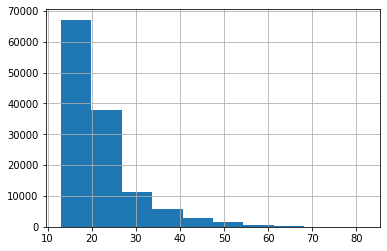

In [14]:
dados["NU_IDADE"].hist()

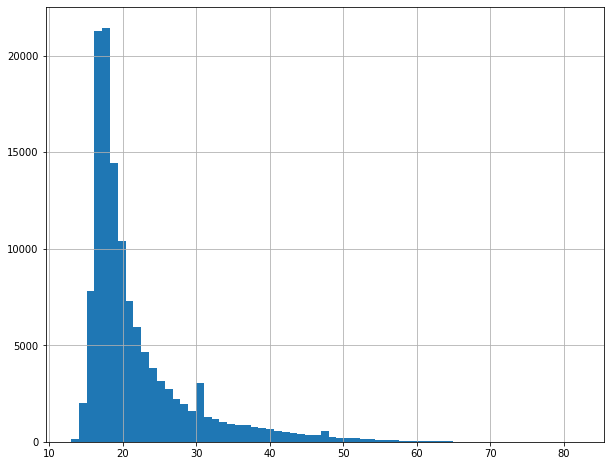

In [15]:
# Podemos modificar o número de colunas para representar melhor nossa distribuição gráfica
dados["NU_IDADE"].hist(bins = 65, figsize=(10,8))

In [16]:
### Desafio 03: Colocar títulos na imagens ###

In [17]:
dados["IN_TREINEIRO"]

0         1
1         0
2         0
3         0
4         1
         ..
127375    0
127376    0
127377    0
127378    0
127379    0
Name: IN_TREINEIRO, Length: 127380, dtype: int64

In [18]:
treinero = dados.query("IN_TREINEIRO == 1")["IN_TREINEIRO"]
# O método query só é aplicado para um dataframe, se eu tiver só uma série
# ex: dados["NU_IDADE"], não vai funcionar.

quantidade_treineiro = len(treinero) # pegando a quantidade de treineiro
print("""Treineiros são alunos que vão fazer a prova do ENEM, mas que não está dispultando uma das vagas.""") # explicação do que seja treineiro
print("Proporção de treineiros com não treineiros") # título para o nosso exemplo
total_de_candidadto = dados.shape[0] # pegando o total de candidatos do dataframe, lembrando que o dados.shape retorna uma tupla, logo precisando colocar o [0], para pegar o número que linhas total, que representa o número total de candidatos.
porcentagem_de_treineiro = round((quantidade_treineiro/total_de_candidadto) * 100, 3) # conta e arrendodar para 3 casa decimais
print(porcentagem_de_treineiro,"%")  #colocar por cento apois o número

Treineiros são alunos que vão fazer a prova do ENEM, mas que não está dispultando uma das vagas.
Proporção de treineiros com não treineiros
12.091 %


In [19]:
dados.query("NU_IDADE == 13")["SG_UF_RESIDENCIA"] # desafio 2 feito de uma maneira bem mais simples <;(

57359     SP
95630     MT
98197     AP
116501    BA
Name: SG_UF_RESIDENCIA, dtype: object

In [20]:
dados.query("IN_TREINEIRO == 1")["NU_IDADE"].value_counts().sort_index()

14      64
15    1927
16    7142
17    4901
18     858
19     228
20      83
21      44
22      30
23      21
24      13
25       8
26      13
27       9
28       6
29      10
30       4
31       4
32       2
33       1
34       3
35       2
36       2
37       1
38       4
39       2
40       4
41       1
42       4
44       2
45       1
46       2
47       1
48       1
51       1
55       1
62       1
Name: NU_IDADE, dtype: int64

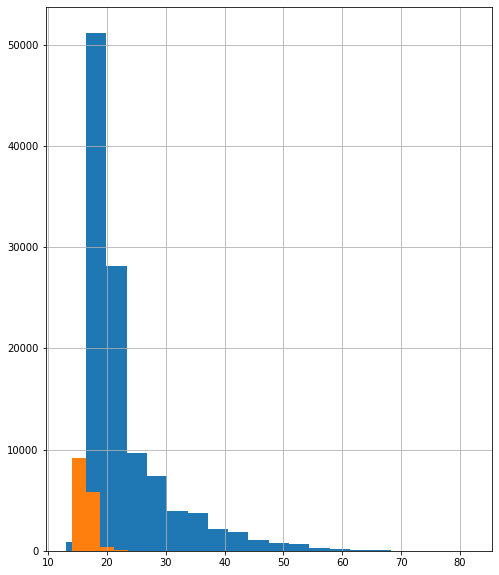

In [21]:
# Fazer o Histograma das idades dos treineiro e não treineiros(se for um por cima do outro melhor)
dados.query("IN_TREINEIRO == 0")["NU_IDADE"].hist(bins = 20, figsize = (8, 10))
dados.query("IN_TREINEIRO == 1")["NU_IDADE"].hist(bins = 20, figsize = (8, 10))


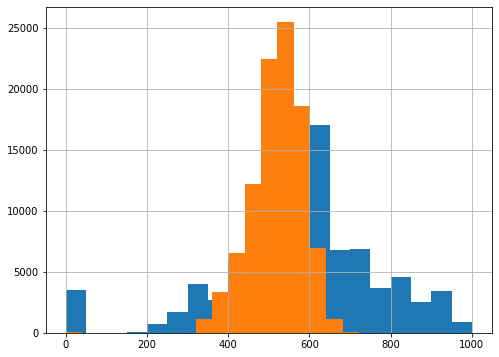

In [22]:
dados["NU_NOTA_REDACAO"].hist(bins = 20, figsize = (8, 6))
dados["NU_NOTA_LC"].hist(bins = 20, figsize = (8, 6))

In [23]:
# Podemos calcular a média da prova de redação
round(dados["NU_NOTA_REDACAO"].mean(), 4)

571.57

In [24]:
# calcular o desvio padrão
round(dados["NU_NOTA_REDACAO"].std())

188.0

In [25]:
provas = ["NU_NOTA_CN","NU_NOTA_CH","NU_NOTA_MT","NU_NOTA_LC","NU_NOTA_REDACAO"]
# Estou colocando os nomes das provas feita no enem

dados[provas].describe()
# Aqui estou pedindo para ele descrever para mim

,NU_NOTA_CN,NU_NOTA_CH,NU_NOTA_MT,NU_NOTA_LC,NU_NOTA_REDACAO
count,92758.000000,98043.000000,92758.000000,98043.000000,98043.000000
mean,477.964015,507.365912,523.555206,520.463928,571.570025
std,76.296099,82.972839,109.416939,64.556578,188.076455
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,418.000000,447.900000,435.300000,483.700000,480.000000
50%,470.200000,510.900000,501.600000,526.100000,580.000000
75%,533.300000,567.100000,598.200000,565.100000,680.000000
max,797.300000,809.400000,985.000000,801.700000,1000.000000


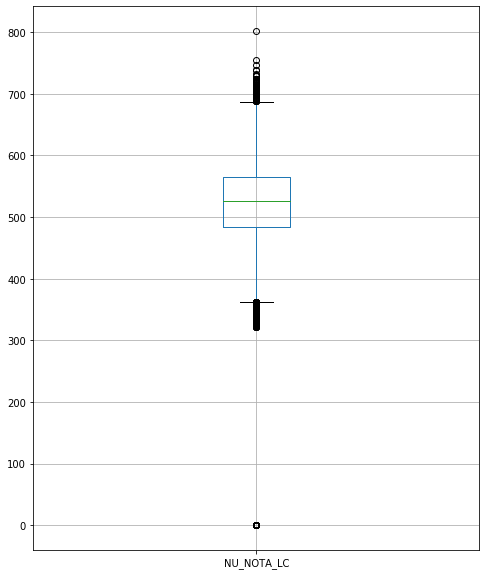

In [26]:
dados["NU_NOTA_LC"].plot.box(grid = True, figsize = (8, 10))

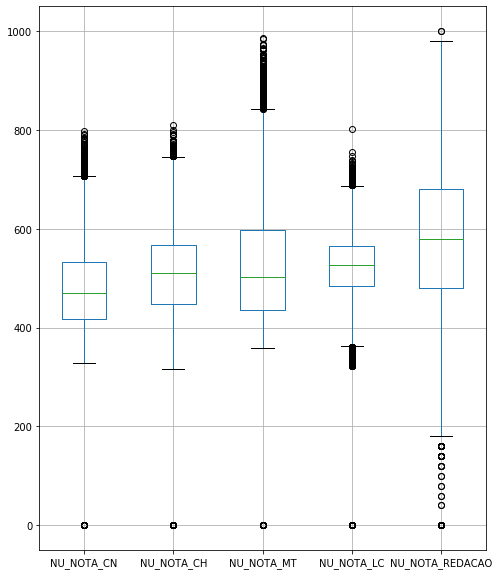

In [27]:
dados[provas].plot.box(grid = True, figsize = (8, 10))

In [28]:
dados.query("NU_IDADE <= 14")["SG_UF_RESIDENCIA"].value_counts(normalize = True)

PE    0.124138
CE    0.103448
BA    0.096552
PA    0.082759
MG    0.075862
SP    0.075862
MA    0.062069
PI    0.048276
PB    0.048276
GO    0.048276
DF    0.027586
AM    0.027586
MT    0.027586
PR    0.020690
TO    0.020690
SE    0.020690
SC    0.013793
AL    0.013793
RO    0.013793
MS    0.006897
ES    0.006897
RJ    0.006897
RS    0.006897
RN    0.006897
AC    0.006897
AP    0.006897
Name: SG_UF_RESIDENCIA, dtype: float64

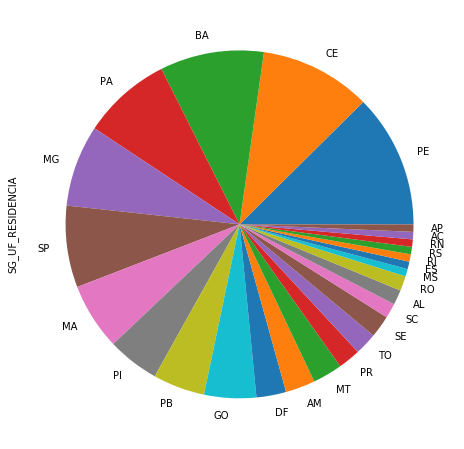

In [29]:
alunos_menor_quartoze = dados.query("NU_IDADE <= 14")
alunos_menor_quartoze["SG_UF_RESIDENCIA"].value_counts().plot.pie(figsize = (10, 8))

In [30]:
### O gráfico de pizza ficou muito ruin para fazer uma comparação

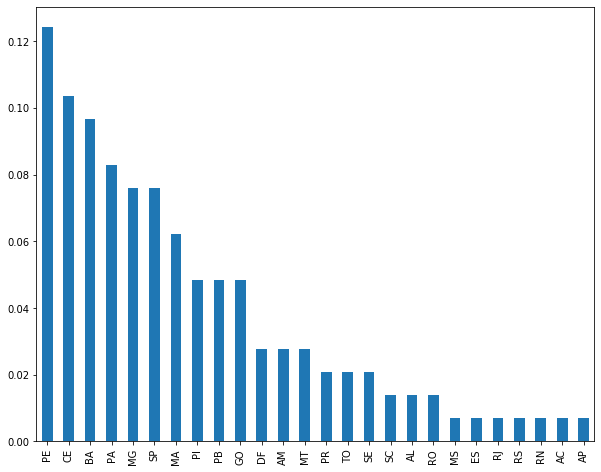

In [31]:
alunos_menor_quartoze["SG_UF_RESIDENCIA"].value_counts(normalize = True).plot.bar(figsize = (10, 8))

In [32]:
# O gráfico de barra é bem melhor para fazer comparações

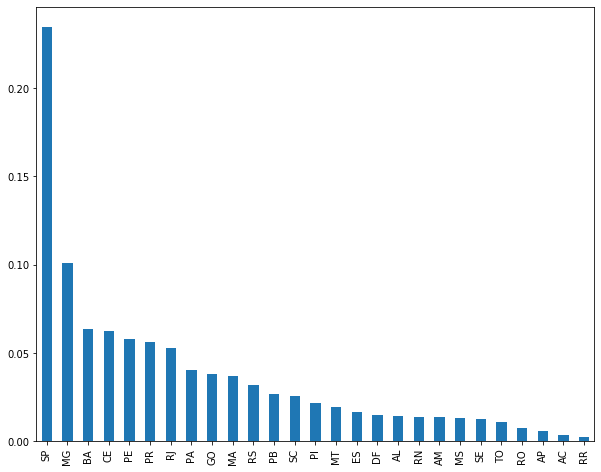

In [33]:
dados.query("NU_IDADE < 18")["SG_UF_RESIDENCIA"].value_counts(normalize = True).plot.bar(figsize = (10, 8))

Text(0.5, 1.0, 'Boxplot das notas de matemática pela renda')

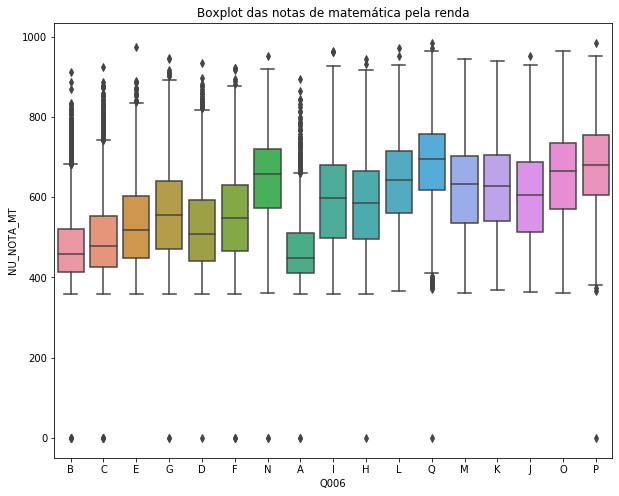

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt 

plt.figure(figsize = (10, 8))
sns.boxplot(x= "Q006", y= "NU_NOTA_MT", data = dados)
plt.title("Boxplot das notas de matemática pela renda")

In [35]:
# Na célula acima importamos a biblioteca seaborn(caso vc não tenha instalado é só rodar no terminal 
# o comando 'pip install seaborn') 
# importamos tbm o matplotlib
# foi configurado o tamanho da figura com o plt.figure(figsize = (10, 8))
# com o seaborn imprimimos um grafico boxplot e foi configurado os eixos do grafico com algumas 
# colunas do nosso dataframe dados
# Demos um título ao gráfico


In [36]:
# Queremos modificar a ordem do eixo x começando do A até a ultima letra
renda_ordenada = dados["Q006"].unique() # pegamos os elementos unicos e jogamos dentro da variável renda_ordenada
renda_ordenada.sort() # agora ordenamos

In [37]:
renda_ordenada

array(['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M',
       'N', 'O', 'P', 'Q'], dtype=object)

Text(0.5, 1.0, 'Boxplot das notas de matemática pela renda')

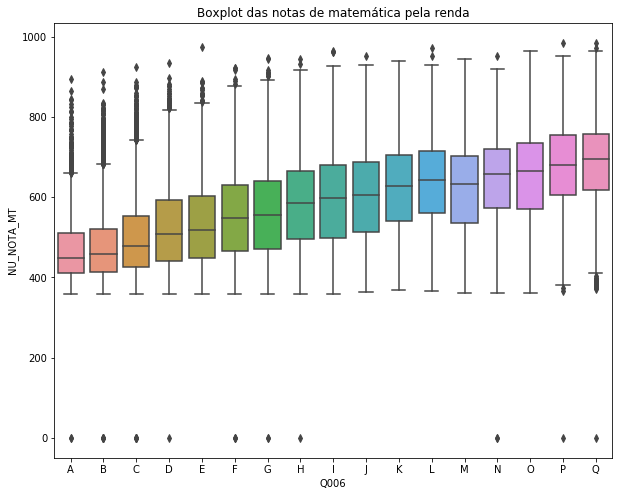

In [38]:
# Aqui fazemos o msm processo da célula acima, só que setemos o parametro order com o valor da
# variável renda_ordenda e o resultado logo abaixo.
plt.figure(figsize = (10, 8))
sns.boxplot(x= "Q006", y= "NU_NOTA_MT", data = dados, order= renda_ordenada)
plt.title("Boxplot das notas de matemática pela renda")

In [39]:
dados[provas].sum()

NU_NOTA_CN         44334986.1
NU_NOTA_CH         49743676.1
NU_NOTA_MT         48563933.8
NU_NOTA_LC         51027844.9
NU_NOTA_REDACAO    56038440.0
dtype: float64

In [40]:
dados["NU_NOTA_TOTAL"] = dados[provas].sum(axis = 1)
dados.head()

,NU_INSCRICAO,NU_ANO,CO_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA,CO_UF_RESIDENCIA,SG_UF_RESIDENCIA,NU_IDADE,TP_SEXO,TP_ESTADO_CIVIL,TP_COR_RACA,...,Q017,Q018,Q019,Q020,Q021,Q022,Q023,Q024,Q025,NU_NOTA_TOTAL
0,190001004661,2019,1506138,Redenção,15,PA,17,M,1,3,...,A,A,A,B,A,C,A,B,B,2288.9
1,190001004674,2019,1504208,Marabá,15,PA,23,M,1,3,...,A,A,B,A,A,B,A,A,B,1184.6
2,190001004722,2019,1501402,Belém,15,PA,35,F,2,1,...,A,A,B,A,B,B,A,A,B,2350.5
3,190001004735,2019,1507300,São Félix do Xingu,15,PA,23,F,1,3,...,A,A,B,A,A,B,A,A,B,2555.7
4,190001004776,2019,1500800,Ananindeua,15,PA,16,F,1,3,...,A,A,B,A,A,D,A,A,B,2803.5


Text(0.5, 1.0, 'Boxplot das notas total do alunos pela renda')

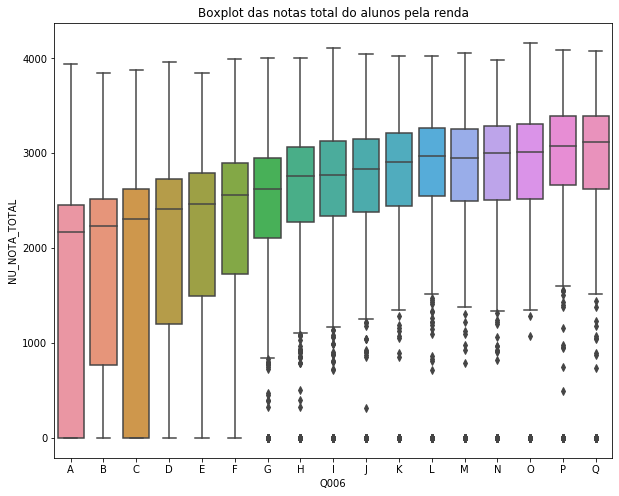

In [41]:
plt.figure(figsize = (10, 8))
sns.boxplot(x= "Q006", y= "NU_NOTA_TOTAL", data = dados, order = renda_ordenada)
plt.title("Boxplot das notas total do alunos pela renda")

In [42]:
# Desafio: criar uma função
# o que fez as pessoas tirar notas zero 

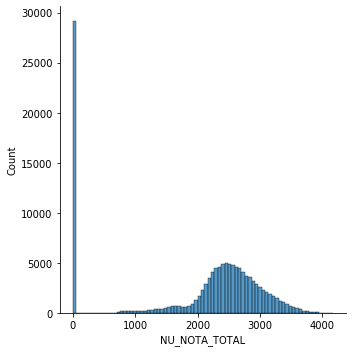

In [43]:
sns.displot(dados, x = "NU_NOTA_TOTAL")

In [44]:
provas.append("NU_NOTA_TOTAL")
dados.query("NU_NOTA_TOTAL == 0")[provas]

,NU_NOTA_CN,NU_NOTA_CH,NU_NOTA_MT,NU_NOTA_LC,NU_NOTA_REDACAO,NU_NOTA_TOTAL
10,NaN,NaN,NaN,NaN,NaN,0.0
11,NaN,NaN,NaN,NaN,NaN,0.0
26,NaN,NaN,NaN,NaN,NaN,0.0
38,NaN,NaN,NaN,NaN,NaN,0.0
40,NaN,NaN,NaN,NaN,NaN,0.0
...,...,...,...,...,...,...
127351,NaN,NaN,NaN,NaN,NaN,0.0
127365,NaN,NaN,NaN,NaN,NaN,0.0
127366,NaN,NaN,NaN,NaN,NaN,0.0
127368,NaN,NaN,NaN,NaN,NaN,0.0


In [45]:
# como a ultima formatação percebeceu que muitas pessoas que tiraram zero não foram fazer a prova, e 
# a maior parte das pessoas são da classe A de renda, ou seja, pessoas de classe mais baixas tiraram 
# notas zero pq não frequenteram as provas. Pq elas não foram fazer a prova ?

In [46]:
# Desafio: Verificar se quem zerou a prova foi eliminado ou não estava presente
# Desafio: Quem é eliminado da prova que nota tira.

In [47]:
dados_sem_notas_zero = dados.query("NU_NOTA_TOTAL != 0")
dados_sem_notas_zero

,NU_INSCRICAO,NU_ANO,CO_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA,CO_UF_RESIDENCIA,SG_UF_RESIDENCIA,NU_IDADE,TP_SEXO,TP_ESTADO_CIVIL,TP_COR_RACA,...,Q017,Q018,Q019,Q020,Q021,Q022,Q023,Q024,Q025,NU_NOTA_TOTAL
0,190001004661,2019,1506138,Redenção,15,PA,17,M,1,3,...,A,A,A,B,A,C,A,B,B,2288.9
1,190001004674,2019,1504208,Marabá,15,PA,23,M,1,3,...,A,A,B,A,A,B,A,A,B,1184.6
2,190001004722,2019,1501402,Belém,15,PA,35,F,2,1,...,A,A,B,A,B,B,A,A,B,2350.5
3,190001004735,2019,1507300,São Félix do Xingu,15,PA,23,F,1,3,...,A,A,B,A,A,B,A,A,B,2555.7
4,190001004776,2019,1500800,Ananindeua,15,PA,16,F,1,3,...,A,A,B,A,A,D,A,A,B,2803.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127375,190006120035,2019,3142700,Montalvânia,31,MG,17,F,1,1,...,A,A,B,A,A,D,A,B,B,2867.4
127376,190006120036,2019,2902807,Barra da Estiva,29,BA,18,M,1,2,...,A,A,B,A,A,D,A,B,B,2218.5
127377,190006120037,2019,2927408,Salvador,29,BA,22,F,1,3,...,A,A,A,A,A,B,A,A,B,1453.9
127378,190006120060,2019,2930709,Simões Filho,29,BA,26,F,2,2,...,A,A,B,A,A,C,A,A,A,2573.9


Text(0.5, 1.0, 'Boxplot das notas total do alunos pela renda')

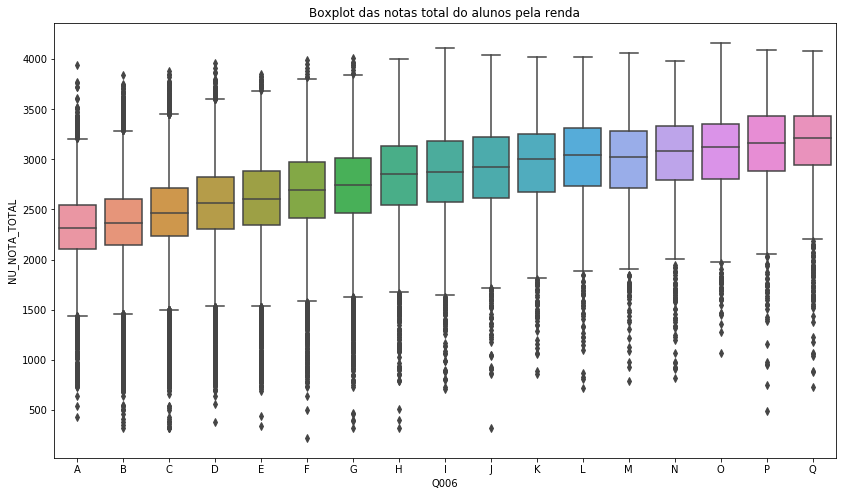

In [48]:
plt.figure(figsize = (14, 8))
sns.boxplot(x= "Q006", y= "NU_NOTA_TOTAL", data = dados_sem_notas_zero, order = renda_ordenada)
plt.title("Boxplot das notas total do alunos pela renda")

Text(0.5, 1.0, 'Boxplot das notas total do alunos pela renda')

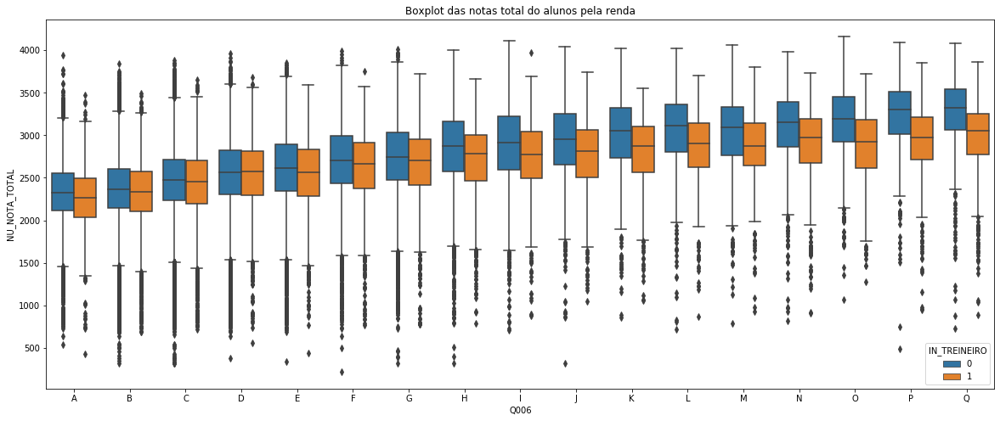

In [49]:
plt.figure(figsize = (20, 8))
sns.boxplot(x= "Q006", y= "NU_NOTA_TOTAL", data = dados_sem_notas_zero, hue="IN_TREINEIRO",
            order = renda_ordenada)
plt.title("Boxplot das notas total do alunos pela renda")

In [50]:
# Desafio: Verificar a proporção dos participantes de rendas mmais altas e mais baixas como 
# treineiros e não treiniros

#Desafio: fazer o msm boxplot olhando para a questão 25(tem internet sim ou não) e fazer umma 
# reflexão sobre o assunto e o contexto de pandemia.


In [51]:
###   Aula 03

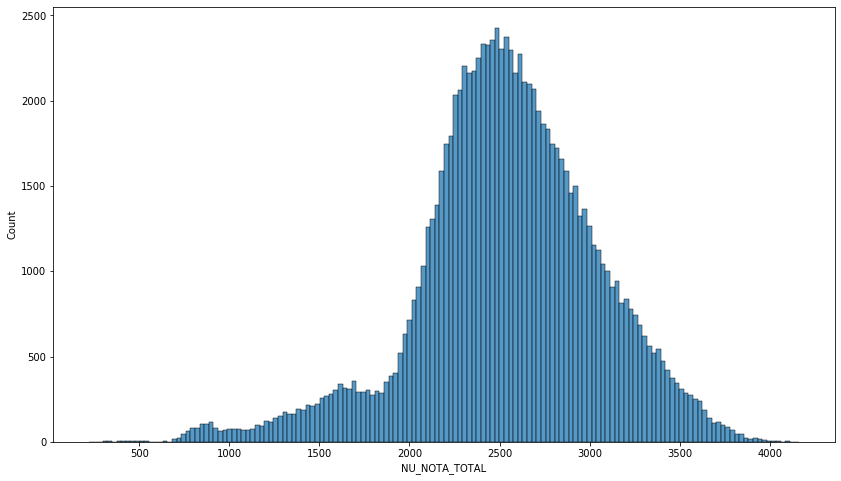

In [53]:
plt.figure(figsize=(14, 8))
sns.histplot(dados_sem_notas_zero, x = "NU_NOTA_TOTAL")

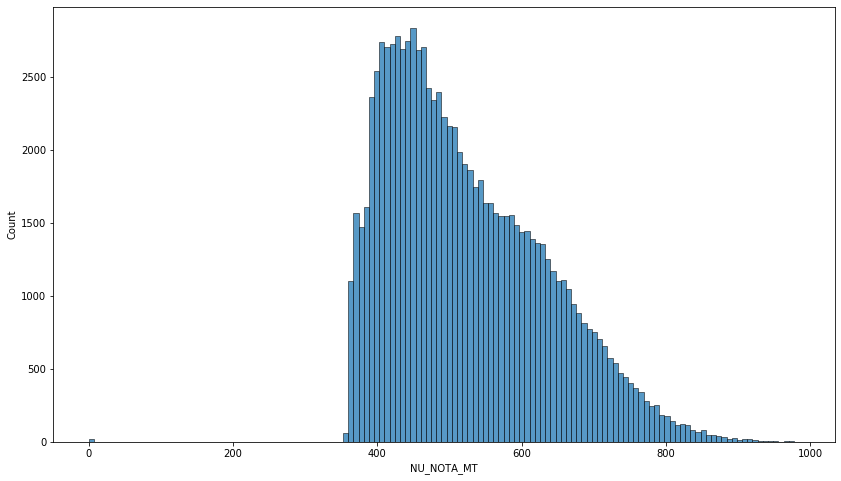

In [54]:
plt.figure(figsize=(14, 8))
sns.histplot(dados_sem_notas_zero, x = "NU_NOTA_MT")

In [55]:
### plotar as médias, medianas e moda nas notas LC e MT para saber se é assimetrica a esquerda

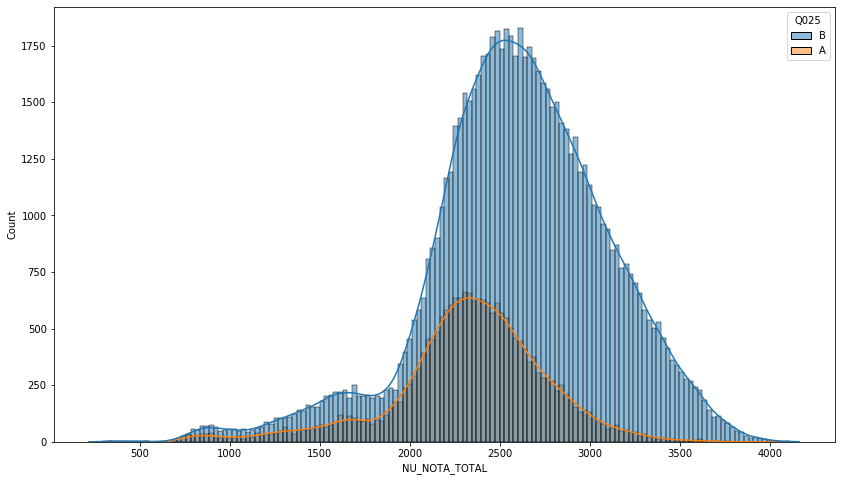

In [57]:
plt.figure(figsize=(14, 8))
sns.histplot(dados_sem_notas_zero, x = "NU_NOTA_TOTAL", hue="Q025", kde=True)

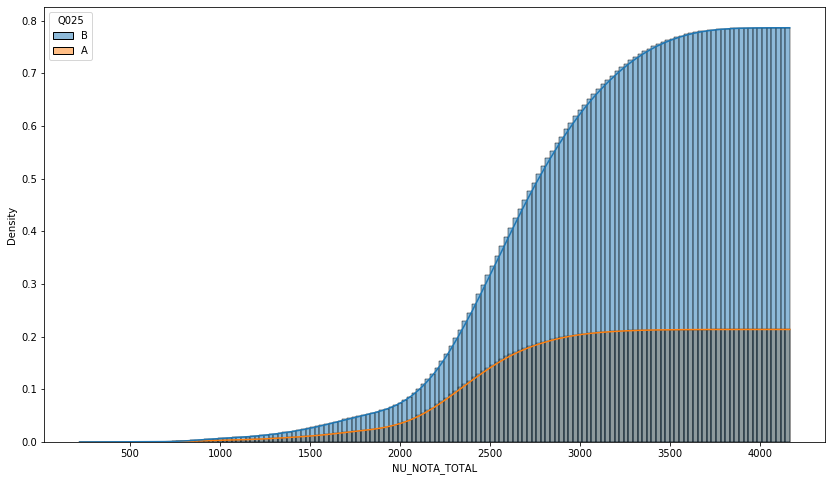

In [61]:
plt.figure(figsize=(14, 8))
sns.histplot(dados_sem_notas_zero, x = "NU_NOTA_TOTAL", hue="Q025", kde=True, stat="density", cumulative=True)

(50, 1050)

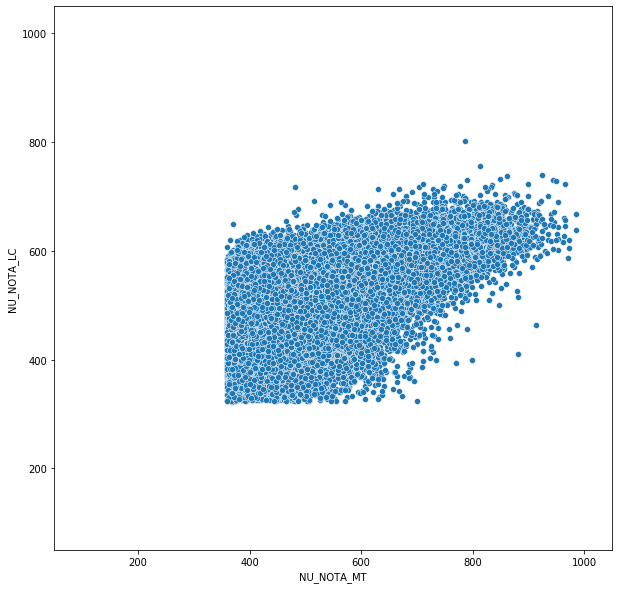

In [65]:
plt.figure(figsize = ( 10, 10))
sns.scatterplot(data = dados_sem_notas_zero, x = "NU_NOTA_MT", y = "NU_NOTA_LC")
plt.xlim((50, 1050))
plt.ylim((50, 1050))

In [ ]:
sns.pairplot(dados_sem_notas_zero[provas])